Test


In [1]:
import numpy as np
import cv2
from skimage.metrics import mean_squared_error as mse
import matplotlib.pyplot as plt
import time

In [2]:
# Hàm tạo nhiễu Gaussian
def add_noise(image, snr):
    noise_std = np.sqrt(np.mean(image ** 2) / (10 ** (snr / 10)))
    noise = np.random.normal(0, noise_std, image.shape)
    return image + noise



In [3]:
# Hàm tính toán ngưỡng
def thresholding(coeff, threshold):
    return coeff * (np.abs(coeff) >= threshold)



In [4]:
def calculate_compression_ratio(original_img, compressed_img):
    # Lưu ảnh gốc
    cv2.imwrite('temp_original.png', (original_img * 255).astype(np.uint8))
    # Lưu ảnh đã nén
    cv2.imwrite('temp_compressed.png', (compressed_img * 255).astype(np.uint8))
    
    # Đọc kích thước file
    import os
    original_size = os.path.getsize('temp_original.png')
    compressed_size = os.path.getsize('temp_compressed.png')
    
    # Xóa file tạm
    os.remove('temp_original.png')
    os.remove('temp_compressed.png')
    
    return original_size / compressed_size if compressed_size > 0 else float('inf')

In [5]:
def wavelet_transform(img, threshold):
    rows, cols = img.shape
    
    coeffs = np.zeros_like(img)
    
    # Row transformation    
    for i in range(rows):
        row = img[i,:]
        cA = (row[::2] + row[1::2]) / np.sqrt(2)  # Low-pass
        cD = (row[::2] - row[1::2]) / np.sqrt(2)  # High-pass
        
        coeffs[i,:cols//2] = cA
        coeffs[i,cols//2:] = cD
    
    # Column transformation  
    temp = coeffs.copy()
    for j in range(cols):
        col = temp[:,j]
        cA = (col[::2] + col[1::2]) / np.sqrt(2)
        cD = (col[::2] - col[1::2]) / np.sqrt(2)
        
        coeffs[:rows//2,j] = cA 
        coeffs[rows//2:,j] = cD

    coeffs = coeffs * (np.abs(coeffs) >= threshold)
    
    # Column reconstruction
    temp = coeffs.copy()
    for j in range(cols):
        cA = temp[:rows//2,j]
        cD = temp[rows//2:,j]
        
        col = np.zeros(rows)
        col[::2] = (cA + cD) / np.sqrt(2)
        col[1::2] = (cA - cD) / np.sqrt(2)
        
        coeffs[:,j] = col
        
    # Row reconstruction
    result = coeffs.copy()
    for i in range(rows):
        cA = coeffs[i,:cols//2] 
        cD = coeffs[i,cols//2:]
        
        row = np.zeros(cols)
        row[::2] = (cA + cD) / np.sqrt(2)
        row[1::2] = (cA - cD) / np.sqrt(2)
        
        result[i,:] = row
    
    return result

In [6]:
def dct_transform(img, threshold):
    def dct2d(block):
        M, N = block.shape
        
        x_indices = np.arange(M).reshape(-1, 1)
        u_indices = np.arange(M).reshape(1, -1)
        
        y_indices = np.arange(N).reshape(-1, 1)
        v_indices = np.arange(N).reshape(1, -1)
        
        cos_terms_x = np.cos(np.pi * (2*x_indices + 1) * u_indices / (2*M))
        cos_terms_y = np.cos(np.pi * (2*y_indices + 1) * v_indices / (2*N))
        
        # Alpha coefficients
        alpha_u = np.sqrt(2/M) * np.ones(M)
        alpha_u[0] = 1/np.sqrt(M)
        alpha_v = np.sqrt(2/N) * np.ones(N)
        alpha_v[0] = 1/np.sqrt(N)
        
        temp = cos_terms_x.T @ block
        result = temp @ cos_terms_y
        
        return result * np.outer(alpha_u, alpha_v)

    def idct2d(block):
        M, N = block.shape
        
        x_indices = np.arange(M).reshape(-1, 1)
        u_indices = np.arange(M).reshape(1, -1)
        
        y_indices = np.arange(N).reshape(-1, 1)
        v_indices = np.arange(N).reshape(1, -1)

        cos_terms_x = np.cos(np.pi * (2*x_indices + 1) * u_indices / (2*M))
        cos_terms_y = np.cos(np.pi * (2*y_indices + 1) * v_indices / (2*N))
        
        # Alpha coefficients
        alpha_u = np.sqrt(2/M) * np.ones(M)
        alpha_u[0] = 1/np.sqrt(M)
        alpha_v = np.sqrt(2/N) * np.ones(N)
        alpha_v[0] = 1/np.sqrt(N)
        
        scaled_block = block * np.outer(alpha_u, alpha_v)
        
        temp = cos_terms_x @ scaled_block
        return temp @ cos_terms_y.T

    # Images are processed in 8x8 blocks
    block_size = 8
    rows, cols = img.shape
    result = np.zeros_like(img)
    
    # Pad image if necessary
    pad_rows = block_size - (rows % block_size) if rows % block_size != 0 else 0
    pad_cols = block_size - (cols % block_size) if cols % block_size != 0 else 0
    if pad_rows > 0 or pad_cols > 0:
        img = np.pad(img, ((0, pad_rows), (0, pad_cols)), mode='constant')
    
    for i in range(0, rows, block_size):
        for j in range(0, cols, block_size):
            block = img[i:i+block_size, j:j+block_size]
            
            dct_block = dct2d(block)
            
            dct_block = thresholding(dct_block, threshold)
            
            result[i:i+block_size, j:j+block_size] = idct2d(dct_block)
    
    # Remove padding if any
    return result[:rows, :cols]

In [7]:
def rfft_transform(image, threshold):
    def recursive_fft(x):
        N = len(x)
        if N <= 1:
            return x
        
        # Split into even and odd
        even = recursive_fft(x[0::2])
        odd = recursive_fft(x[1::2])
        
        # Calculate rotation coefficients
        T = [np.exp(-2j * np.pi * k / N) * odd[k] for k in range(N//2)]
        return [even[k] + T[k] for k in range(N//2)] + [even[k] - T[k] for k in range(N//2)]
    
    def recursive_fft2(img):
        # FFT on rows
        rows = np.array([recursive_fft(list(row)) for row in img])
        # FFT on columns
        cols = np.array([recursive_fft(list(col)) for col in rows.T]).T
        return cols
        
    def recursive_ifft(x):
        N = len(x)
        if N <= 1:
            return x
            
        x = np.array(x)
        # Take complex conjugate
        x_conj = np.conj(x)
        # Perform FFT
        y = recursive_fft(x_conj)
        # Take complex conjugate and divide by N
        return np.conj(y) / N

    def recursive_ifft2(img):
        # IFFT on rows
        rows = np.array([recursive_ifft(list(row)) for row in img])
        # IFFT on columns
        cols = np.array([recursive_ifft(list(col)) for col in rows.T]).T
        return cols

    def thresholding(f_transform, threshold):
        # Calculate magnitude
        magnitude = np.abs(f_transform)
        # Create mask based on threshold
        mask = magnitude > threshold
        # Apply mask
        return f_transform * mask

    # Perform FFT transform
    f_transform = recursive_fft2(image)
    
    # Apply threshold
    f_transform_thresh = thresholding(f_transform, threshold)
    
    # Perform inverse FFT transform
    restored = np.real(recursive_ifft2(f_transform_thresh))
    
    return restored 


In [8]:
# General processing function
def process_image(img, method, threshold, noisy_image=None):
    if noisy_image is not None:
        input_img = noisy_image
    else:
        input_img = img
        
    # Split color channels
    b, g, r = cv2.split(input_img)
    
    # Process each color channel and calculate compression ratio
    if method == 'wavelet':
        b_processed = wavelet_transform(b, threshold)
        g_processed = wavelet_transform(g, threshold)
        r_processed = wavelet_transform(r, threshold)
    elif method == 'dct':
        b_processed = dct_transform(b, threshold)
        g_processed = dct_transform(g, threshold)
        r_processed = dct_transform(r, threshold)
    elif method == 'fft':
        b_processed = rfft_transform(b, threshold)
        g_processed = rfft_transform(g, threshold)
        r_processed = rfft_transform(r, threshold)
    
    # Merge processed color channels
    restored = cv2.merge([b_processed, g_processed, r_processed])
    
    # Calculate MSE between original and restored image and compression ratio
    error = mse(img, restored)
    compression_ratio = calculate_compression_ratio(img, restored)
    
    return restored, error, compression_ratio


In [9]:
def show_images(images, titles):
    n = len(images)
    plt.figure(figsize=(15, 5))
    
    for i in range(n):
        plt.subplot(1, n, i + 1)
        # Convert from float64 to uint8
        img_uint8 = (images[i] * 255).astype(np.uint8)
        rgb_img = cv2.cvtColor(img_uint8, cv2.COLOR_BGR2RGB)
        plt.imshow(rgb_img)
        plt.title(titles[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

Processing image: bg_1.png
Method: wavelet
MSE (no noise): 0.0009424726
Execution time: 0.335 seconds
Compression ratio: 1.40

Method: dct
MSE (no noise): 0.0008119187
Execution time: 2.342 seconds
Compression ratio: 1.69

Method: fft
MSE (no noise): 0.0000000001
Execution time: 41.089 seconds
Compression ratio: 0.96



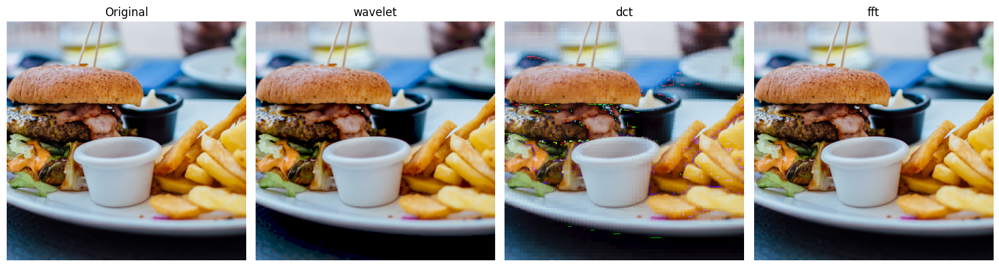

Method: wavelet, SNR: 5
MSE (with noise): 0.1001083881
Execution time: 0.231 seconds
Compression ratio: 0.53

Method: dct, SNR: 5
MSE (with noise): 0.0988474335
Execution time: 2.490 seconds
Compression ratio: 0.51

Method: fft, SNR: 5
MSE (with noise): 0.1043742715
Execution time: 40.007 seconds
Compression ratio: 0.51



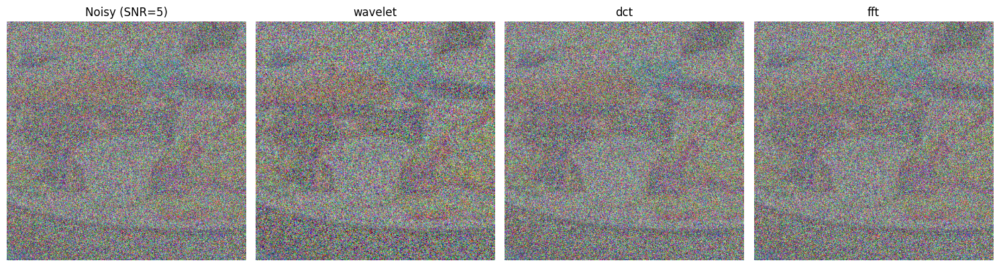

Method: wavelet, SNR: 10
MSE (with noise): 0.0272118017
Execution time: 0.228 seconds
Compression ratio: 0.61

Method: dct, SNR: 10
MSE (with noise): 0.0255735753
Execution time: 2.376 seconds
Compression ratio: 0.52

Method: fft, SNR: 10
MSE (with noise): 0.0330431830
Execution time: 39.763 seconds
Compression ratio: 0.51



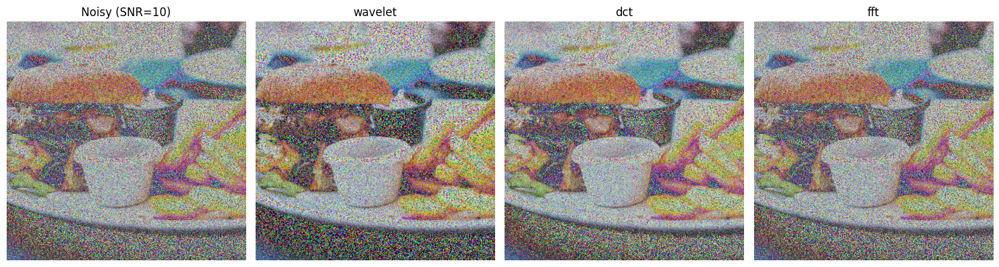

Method: wavelet, SNR: 20
MSE (with noise): 0.0016964377
Execution time: 0.642 seconds
Compression ratio: 1.12

Method: dct, SNR: 20
MSE (with noise): 0.0009692606
Execution time: 2.466 seconds
Compression ratio: 1.43

Method: fft, SNR: 20
MSE (with noise): 0.0032975372
Execution time: 38.185 seconds
Compression ratio: 0.61



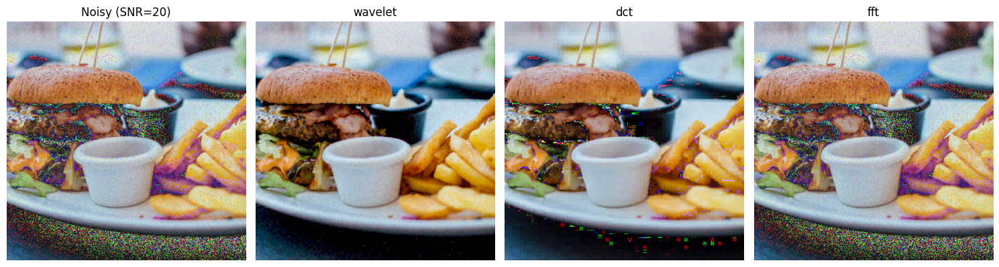

Method: wavelet, SNR: 30
MSE (with noise): 0.0010102922
Execution time: 0.317 seconds
Compression ratio: 1.28

Method: dct, SNR: 30
MSE (with noise): 0.0008274125
Execution time: 1.314 seconds
Compression ratio: 1.67

Method: fft, SNR: 30
MSE (with noise): 0.0003294043
Execution time: 35.041 seconds
Compression ratio: 0.76



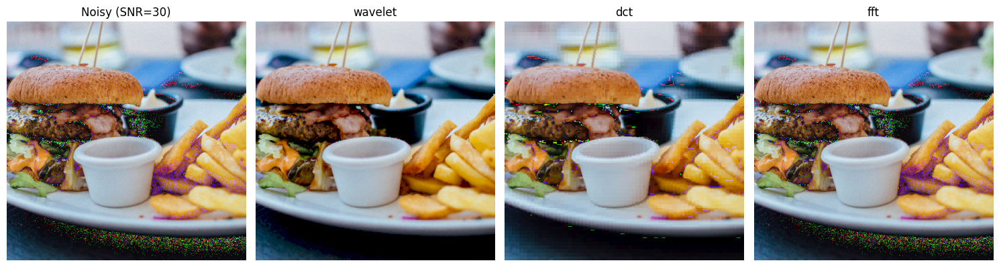

Processing image: scene.png
Method: wavelet
MSE (no noise): 0.0016422517
Execution time: 0.079 seconds
Compression ratio: 1.44

Method: dct
MSE (no noise): 0.0012738464
Execution time: 0.496 seconds
Compression ratio: 1.61

Method: fft
MSE (no noise): 0.0000000006
Execution time: 7.893 seconds
Compression ratio: 0.91



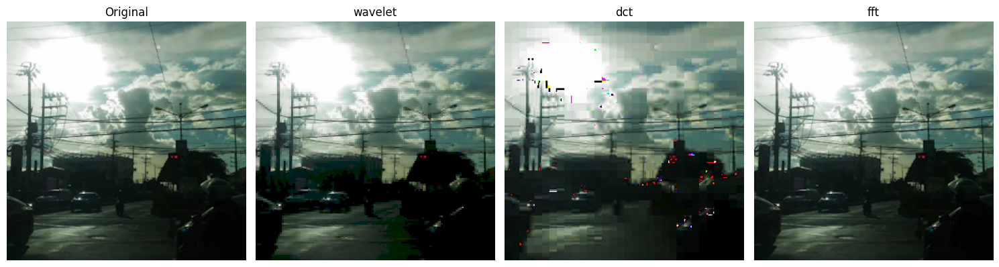

Method: wavelet, SNR: 5
MSE (with noise): 0.0802833235
Execution time: 0.053 seconds
Compression ratio: 0.52

Method: dct, SNR: 5
MSE (with noise): 0.0789222281
Execution time: 0.345 seconds
Compression ratio: 0.49

Method: fft, SNR: 5
MSE (with noise): 0.0847059144
Execution time: 7.044 seconds
Compression ratio: 0.49



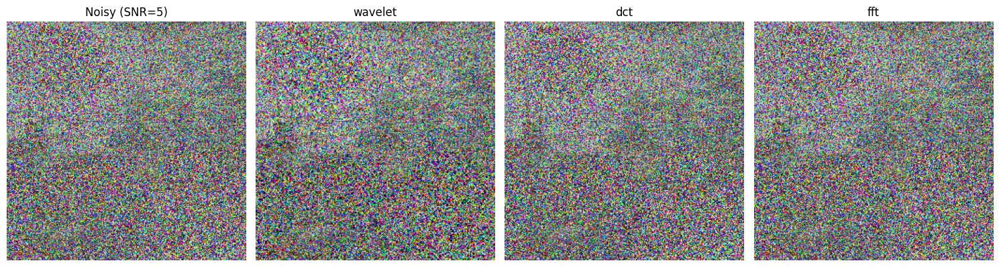

Method: wavelet, SNR: 10
MSE (with noise): 0.0211399591
Execution time: 0.056 seconds
Compression ratio: 0.62

Method: dct, SNR: 10
MSE (with noise): 0.0194427305
Execution time: 0.558 seconds
Compression ratio: 0.51

Method: fft, SNR: 10
MSE (with noise): 0.0266689990
Execution time: 6.765 seconds
Compression ratio: 0.50



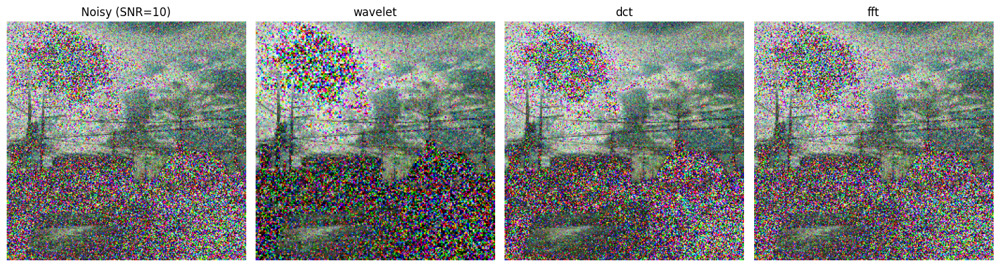

Method: wavelet, SNR: 20
MSE (with noise): 0.0022247879
Execution time: 0.059 seconds
Compression ratio: 1.14

Method: dct, SNR: 20
MSE (with noise): 0.0014123882
Execution time: 0.361 seconds
Compression ratio: 1.36

Method: fft, SNR: 20
MSE (with noise): 0.0026849344
Execution time: 6.630 seconds
Compression ratio: 0.60



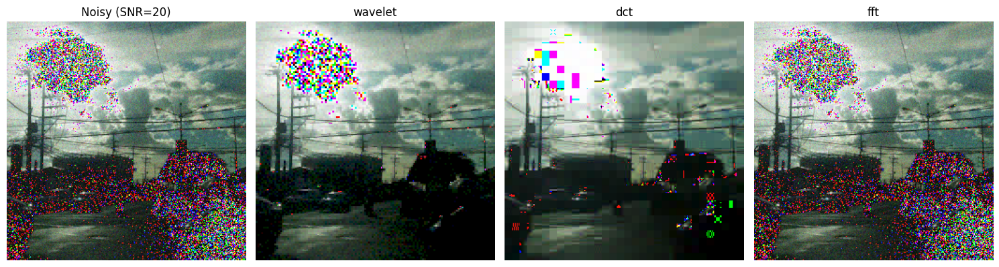

Method: wavelet, SNR: 30
MSE (with noise): 0.0016804139
Execution time: 0.093 seconds
Compression ratio: 1.30

Method: dct, SNR: 30
MSE (with noise): 0.0012827713
Execution time: 0.761 seconds
Compression ratio: 1.56

Method: fft, SNR: 30
MSE (with noise): 0.0002684793
Execution time: 7.997 seconds
Compression ratio: 0.73



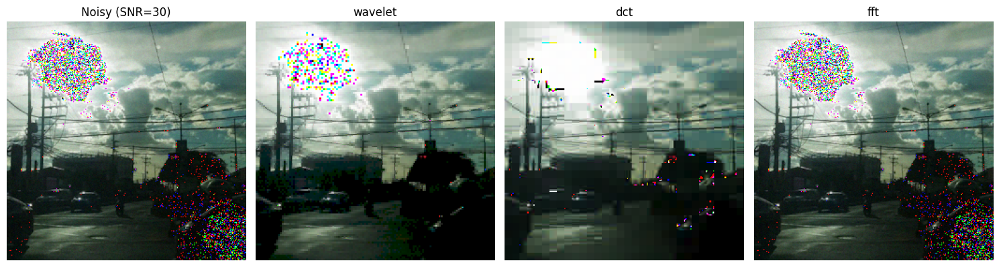

Processing image: saygex.jpg
Method: wavelet
MSE (no noise): 0.0023334675
Execution time: 0.833 seconds
Compression ratio: 2.63

Method: dct
MSE (no noise): 0.0000702776
Execution time: 6.163 seconds
Compression ratio: 1.94

Method: fft
MSE (no noise): 0.0000000006
Execution time: 177.487 seconds
Compression ratio: 0.40



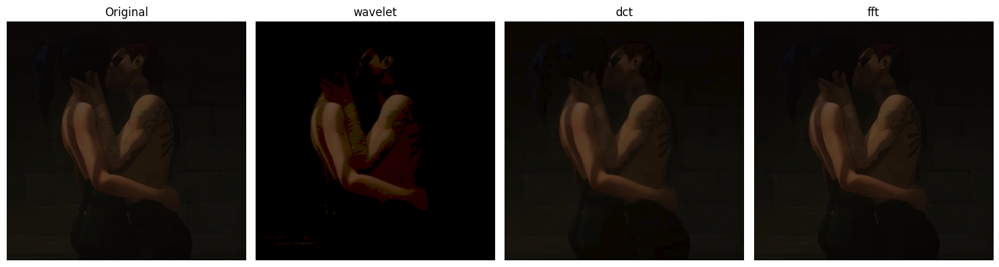

Method: wavelet, SNR: 5
MSE (with noise): 0.0023173194
Execution time: 0.651 seconds
Compression ratio: 1.04

Method: dct, SNR: 5
MSE (with noise): 0.0001158223
Execution time: 7.729 seconds
Compression ratio: 1.08

Method: fft, SNR: 5
MSE (with noise): 0.0017892135
Execution time: 183.994 seconds
Compression ratio: 0.15



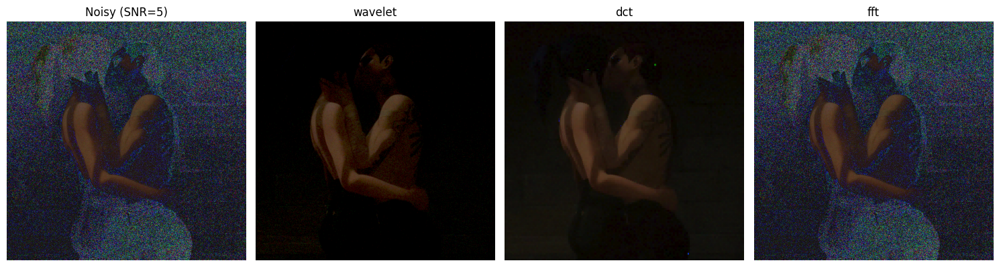

Method: wavelet, SNR: 10
MSE (with noise): 0.0023082134
Execution time: 0.626 seconds
Compression ratio: 1.52

Method: dct, SNR: 10
MSE (with noise): 0.0000858823
Execution time: 7.942 seconds
Compression ratio: 1.22

Method: fft, SNR: 10
MSE (with noise): 0.0005652883
Execution time: 195.335 seconds
Compression ratio: 0.17



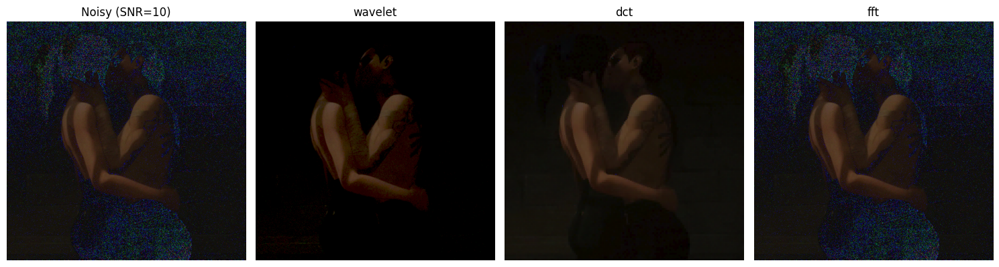

Method: wavelet, SNR: 20
MSE (with noise): 0.0023220636
Execution time: 1.491 seconds
Compression ratio: 2.08

Method: dct, SNR: 20
MSE (with noise): 0.0000704942
Execution time: 9.843 seconds
Compression ratio: 1.43

Method: fft, SNR: 20
MSE (with noise): 0.0000565811
Execution time: 142.726 seconds
Compression ratio: 0.25



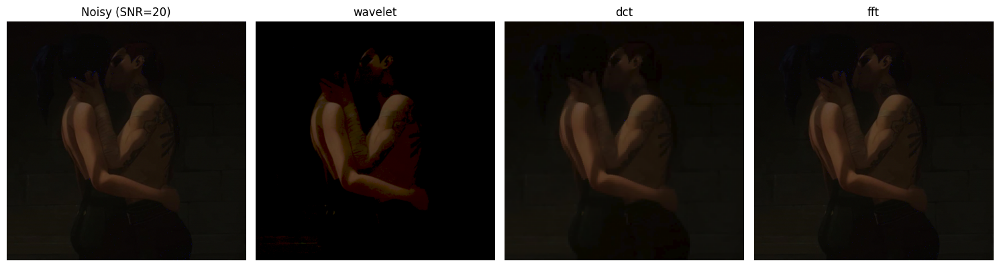

Method: wavelet, SNR: 30
MSE (with noise): 0.0023260359
Execution time: 0.527 seconds
Compression ratio: 2.36

Method: dct, SNR: 30
MSE (with noise): 0.0000698000
Execution time: 5.791 seconds
Compression ratio: 1.53

Method: fft, SNR: 30
MSE (with noise): 0.0000056621
Execution time: 149.510 seconds
Compression ratio: 0.37



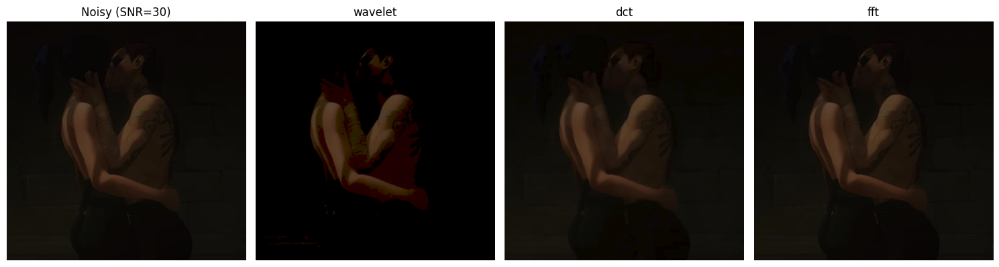

Processing image: cool.jpg
Method: wavelet
MSE (no noise): 0.0017930891
Execution time: 2.732 seconds
Compression ratio: 1.28

Method: dct
MSE (no noise): 0.0001284329
Execution time: 28.571 seconds
Compression ratio: 1.93

Method: fft
MSE (no noise): 0.0000000000
Execution time: 747.941 seconds
Compression ratio: 0.74



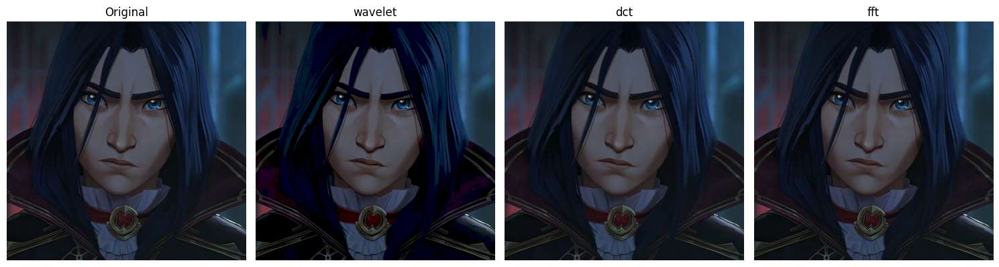

Method: wavelet, SNR: 5
MSE (with noise): 0.0075158914
Execution time: 2.417 seconds
Compression ratio: 0.44

Method: dct, SNR: 5
MSE (with noise): 0.0043454621
Execution time: 25.950 seconds
Compression ratio: 0.32

Method: fft, SNR: 5
MSE (with noise): 0.0119250687
Execution time: 684.861 seconds
Compression ratio: 0.28



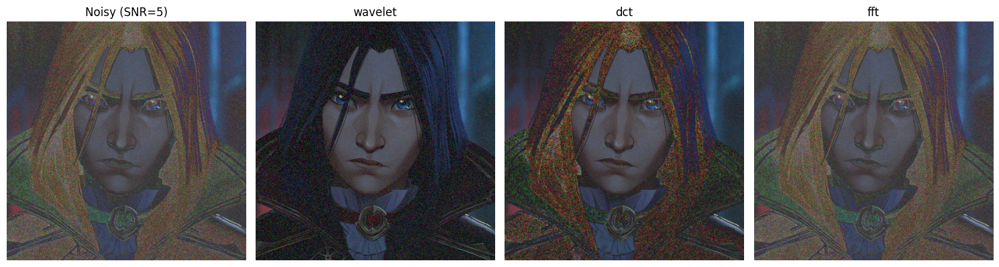

Method: wavelet, SNR: 10
MSE (with noise): 0.0027096478
Execution time: 2.196 seconds
Compression ratio: 0.63

Method: dct, SNR: 10
MSE (with noise): 0.0002553266
Execution time: 21.388 seconds
Compression ratio: 1.19

Method: fft, SNR: 10
MSE (with noise): 0.0037705018
Execution time: 739.144 seconds
Compression ratio: 0.32



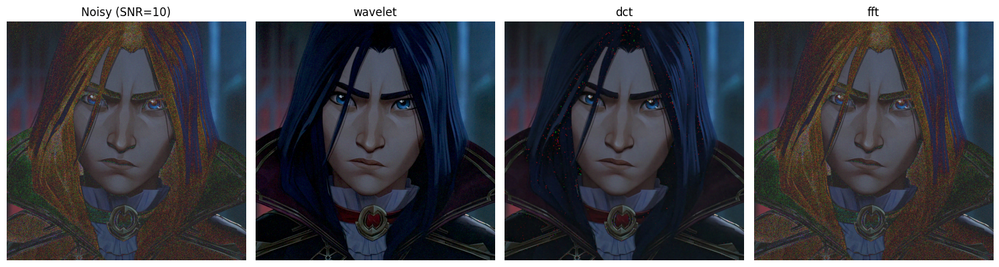

Method: wavelet, SNR: 20
MSE (with noise): 0.0018802643
Execution time: 2.314 seconds
Compression ratio: 0.84

Method: dct, SNR: 20
MSE (with noise): 0.0001348613
Execution time: 25.923 seconds
Compression ratio: 1.82

Method: fft, SNR: 20
MSE (with noise): 0.0003771387
Execution time: 721.289 seconds
Compression ratio: 0.42



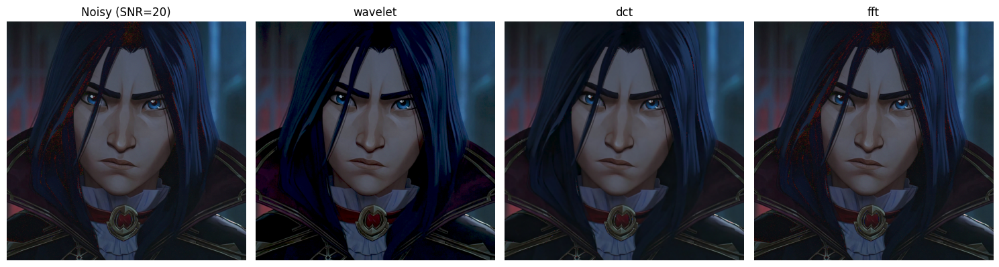

Method: wavelet, SNR: 30
MSE (with noise): 0.0017894091
Execution time: 2.256 seconds
Compression ratio: 1.02

Method: dct, SNR: 30
MSE (with noise): 0.0001289954
Execution time: 27.063 seconds
Compression ratio: 1.89

Method: fft, SNR: 30
MSE (with noise): 0.0000376953
Execution time: 713.838 seconds
Compression ratio: 0.57



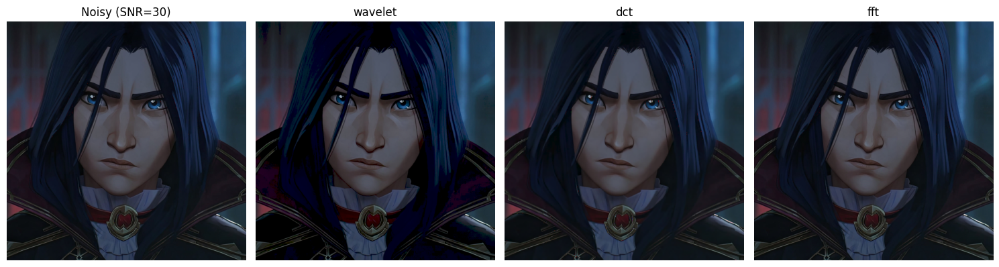

In [10]:
def main():
    img_paths = ['bg_1.png', 'scene.png', 'saygex.jpg', 'cool.jpg']
    for img_path in img_paths:
        img = cv2.imread(img_path, cv2.IMREAD_COLOR) / 255.0
        print(f"Processing image: {img_path}")
        
        # Transform image without noise
        methods = ['wavelet', 'dct', 'fft']
        threshold = 0.2
        restored_images_no_noise = []
        mse_no_noise = []
        execution_times_no_noise = []
        compression_ratios_no_noise = []

        for method in methods:
            start_time = time.time()
            restored, error, compression_ratio = process_image(img, method, threshold)
            end_time = time.time()
            execution_time = end_time - start_time
            
            restored_images_no_noise.append(restored)
            mse_no_noise.append(error)
            execution_times_no_noise.append(execution_time)
            compression_ratio = calculate_compression_ratio(img, restored)
            compression_ratios_no_noise.append(compression_ratio)
            
            print(f"Method: {method}")
            print(f"MSE (no noise): {error:.10f}")
            print(f"Execution time: {execution_time:.3f} seconds")
            print(f"Compression ratio: {compression_ratio:.2f}\n")

        show_images([img] + restored_images_no_noise, ['Original'] + methods)

        # Transform images with noise at different SNR levels
        snr_values = [5, 10, 20, 30]
        for snr in snr_values:
            noisy_img = add_noise(img, snr)
            restored_images_with_noise = []
            mse_with_noise = []
            execution_times_with_noise = []
            compression_ratios_with_noise = []

            for method in methods:
                start_time = time.time()
                restored, error, compression_ratio = process_image(img, method, threshold, noisy_image=noisy_img)
                end_time = time.time()
                execution_time = end_time - start_time
                
                restored_images_with_noise.append(restored)
                mse_with_noise.append(error)
                execution_times_with_noise.append(execution_time)
                compression_ratio = calculate_compression_ratio(img, restored)
                compression_ratios_with_noise.append(compression_ratio)

                print(f"Method: {method}, SNR: {snr}")
                print(f"MSE (with noise): {error:.10f}")
                print(f"Execution time: {execution_time:.3f} seconds")
                print(f"Compression ratio: {compression_ratio:.2f}\n")

            show_images([noisy_img] + restored_images_with_noise, [f'Noisy (SNR={snr})'] + methods)
        
if __name__ == "__main__":
    main()